In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")


Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented/"
x = load(os.path.join(path, 'train/Train_3221.jpg'))
print(x.shape)

(300, 300, 3)


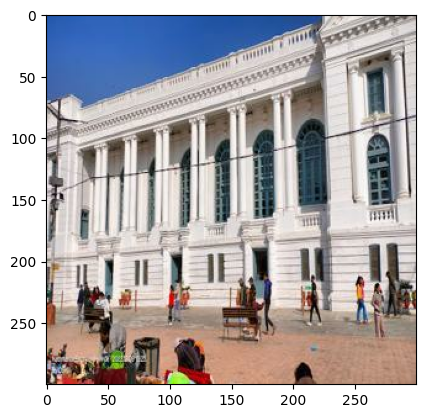

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

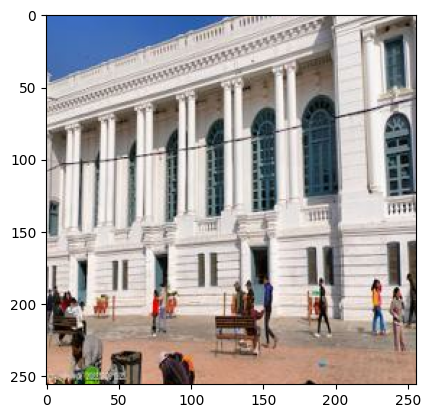

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

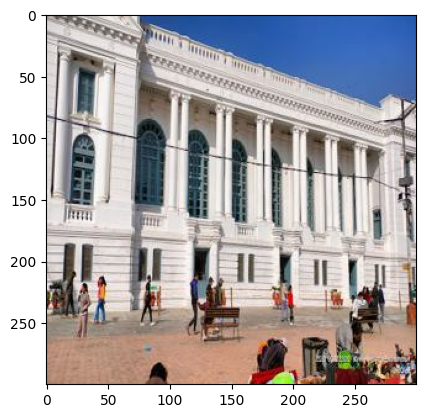

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [16]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [17]:
IMAGE_SIZE = 256
BATCH_SIZE = 32

In [18]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [19]:
test_dataset = tf.data.Dataset.list_files(path + 'val/*.jpg')
test_dataset = test_dataset.map(load_test_image)
test_dataset = test_dataset.batch(BATCH_SIZE)
test_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [20]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 150, 3)


In [21]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 300, 3)


In [22]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(64, 4, batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(256, 4, dropout = True),
        downsample(256, 4, dropout = True),
        downsample(256, 4, dropout = True),
        downsample(256, 4, dropout = True),
        downsample(256, 4, dropout = True)
    ]


    up_stack = [
        upsample(256, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4),
        upsample(64, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

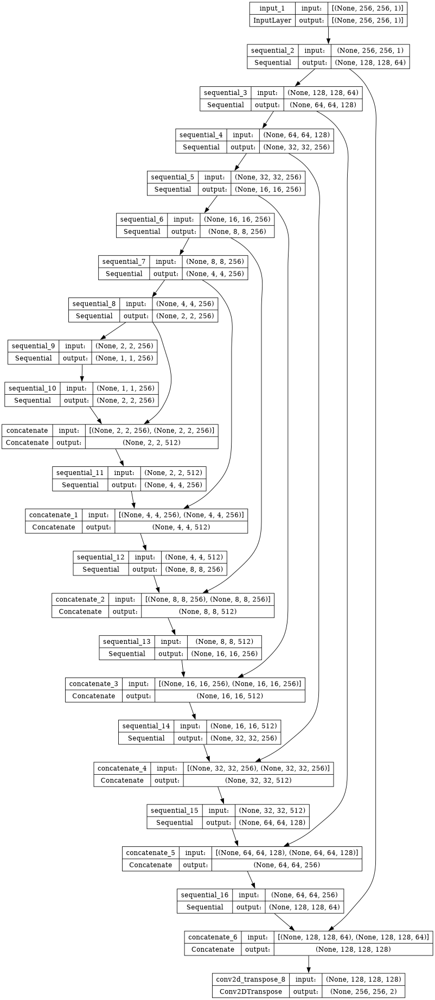

In [23]:
gen = generator()
plot_model(gen, show_shapes=True, dpi = 64)

In [24]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

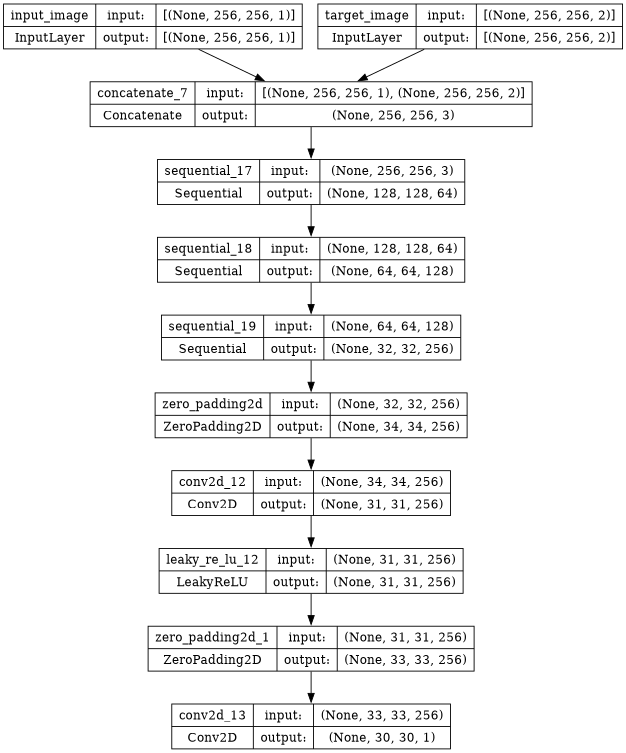

In [25]:
disc = discriminator()
plot_model(disc, show_shapes=True, dpi = 64)

In [26]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [27]:
LAMBDA = 140

In [28]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss, gan_loss, l1_loss

In [29]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [30]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [31]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [32]:
epochs = 200

In [33]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

        ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        if epoch > 10:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values

In [34]:
@tf.function
def test_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

    ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values


In [35]:
os.mkdir('/kaggle/working/gen_output/')

In [36]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))

In [37]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


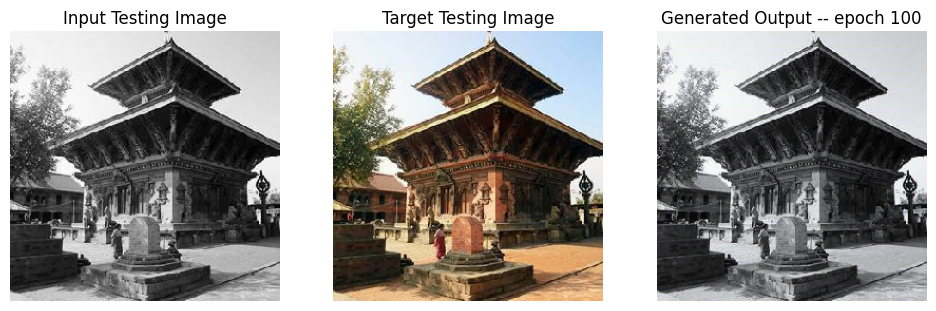

SSIM Score: 0.8732574582099915
PSNR Score: 21.16436004638672


In [38]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_65.jpg',100)

In [39]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
testing_ssim = []
testing_psnr = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_gan_losses, test_generator_l1_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate

    for epoch in range(epochs):
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            train_count += 1
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.2f} gan_loss:{:.2f} l1_loss:{:.2f} Discriminator-- total_loss:{:.2f} real_loss:{:.2f} generated_loss:{:.2f} --- SSIM {:.2f} PSNR {:.2f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print("Number of iteration {d}", train_count)

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr = test_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
        print("Testing Details")
        print("Generator-- total_loss:{:.2f} gan_loss:{:.2f} l1_loss:{:.2f} Discriminator-- total_loss:{:.2f} real_loss:{:.2f} generated_loss:{:.2f} --- SSIM {:.2f} PSNR {:.2f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}: and Lambda = {LAMBDA}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr),LAMBDA])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        if epoch == 0 or epoch % 5 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_65.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if epoch > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [40]:
tf.config.run_functions_eagerly(True)

Epoch 0
Training Details
Generator-- total_loss:7.31 gan_loss:1.10 l1_loss:0.04 Discriminator-- total_loss:1.29 real_loss:0.65 generated_loss:0.64 --- SSIM 0.89 PSNR 22.92
Time taken for epoch 1 is 154.20609855651855 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:20.78 gan_loss:0.66 l1_loss:0.14 Discriminator-- total_loss:1.40 real_loss:0.79 generated_loss:0.61 --- SSIM 0.75 PSNR 12.93
Time taken for epoch 1 is 167.45718836784363 sec
Number of iteration 70: and Lambda = 140
Displaying one random test image...


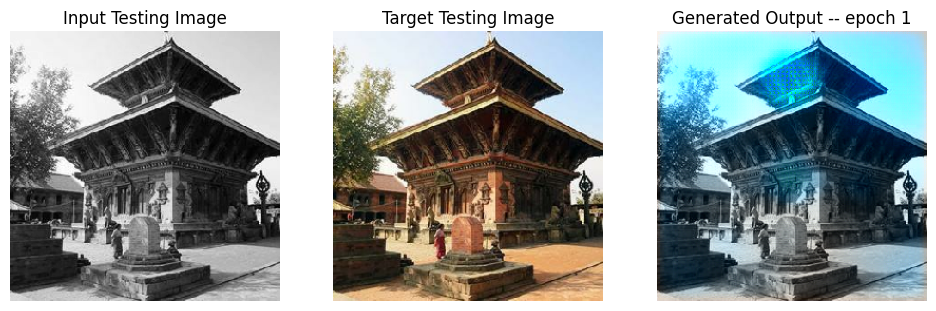

SSIM Score: 0.760492742061615
PSNR Score: 13.041817665100098
Epoch 1
Training Details
Generator-- total_loss:6.39 gan_loss:1.09 l1_loss:0.04 Discriminator-- total_loss:1.32 real_loss:0.66 generated_loss:0.66 --- SSIM 0.94 PSNR 23.93
Time taken for epoch 2 is 149.66320323944092 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:8.50 gan_loss:0.79 l1_loss:0.06 Discriminator-- total_loss:1.39 real_loss:0.65 generated_loss:0.74 --- SSIM 0.92 PSNR 21.67
Time taken for epoch 2 is 162.45431423187256 sec
Number of iteration 70: and Lambda = 140
Epoch 2
Training Details
Generator-- total_loss:6.32 gan_loss:1.00 l1_loss:0.04 Discriminator-- total_loss:1.26 real_loss:0.63 generated_loss:0.63 --- SSIM 0.94 PSNR 23.86
Time taken for epoch 3 is 149.96029329299927 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:8.97 gan_loss:0.78 l1_loss:0.06 Discriminator-- total_loss:1.50 real_loss:0.69 generated_loss:0.81 --- SSIM 0.90 PSNR 20.42
Time taken for epoch 3 is

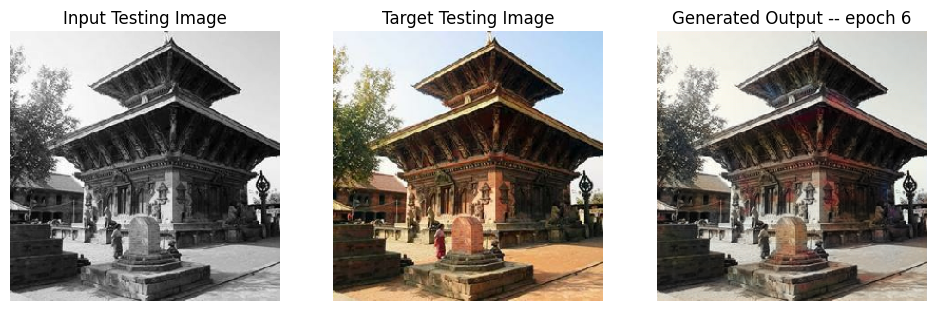

SSIM Score: 0.9654815196990967
PSNR Score: 23.865413665771484
Epoch 6
Training Details
Generator-- total_loss:6.83 gan_loss:1.57 l1_loss:0.04 Discriminator-- total_loss:2.81 real_loss:1.49 generated_loss:1.32 --- SSIM 0.94 PSNR 23.95
Time taken for epoch 7 is 150.357572555542 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:9.63 gan_loss:2.49 l1_loss:0.05 Discriminator-- total_loss:3.06 real_loss:0.30 generated_loss:2.76 --- SSIM 0.89 PSNR 21.72
Time taken for epoch 7 is 163.1508388519287 sec
Number of iteration 70: and Lambda = 140
Epoch 7
Training Details
Generator-- total_loss:5.61 gan_loss:0.88 l1_loss:0.03 Discriminator-- total_loss:1.33 real_loss:0.66 generated_loss:0.67 --- SSIM 0.95 PSNR 25.01
Time taken for epoch 8 is 149.306893825531 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.41 gan_loss:0.47 l1_loss:0.04 Discriminator-- total_loss:1.54 real_loss:1.07 generated_loss:0.46 --- SSIM 0.94 PSNR 23.56
Time taken for epoch 8 is 162

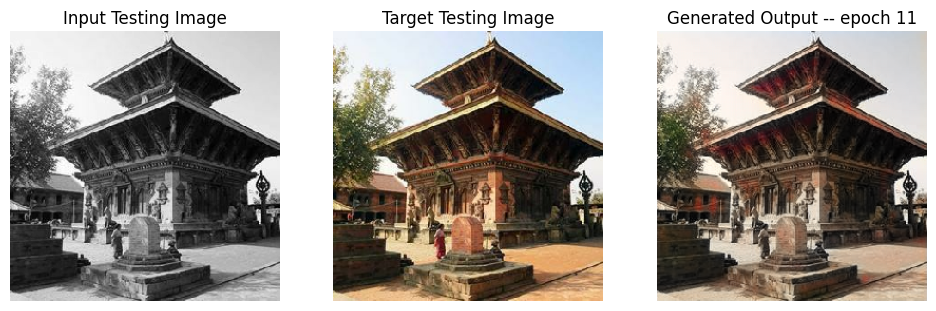

SSIM Score: 0.97315913438797
PSNR Score: 25.993671417236328
Epoch 11
Training Details
Generator-- total_loss:7.83 gan_loss:2.81 l1_loss:0.04 Discriminator-- total_loss:0.65 real_loss:0.33 generated_loss:0.32 --- SSIM 0.94 PSNR 24.15
Time taken for epoch 12 is 104.74224638938904 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.91 gan_loss:0.18 l1_loss:0.04 Discriminator-- total_loss:2.57 real_loss:2.45 generated_loss:0.12 --- SSIM 0.94 PSNR 23.61
Time taken for epoch 12 is 117.710458278656 sec
Number of iteration 70: and Lambda = 140
Epoch 12
Training Details
Generator-- total_loss:9.83 gan_loss:4.83 l1_loss:0.04 Discriminator-- total_loss:0.28 real_loss:0.16 generated_loss:0.12 --- SSIM 0.94 PSNR 24.19
Time taken for epoch 13 is 104.56556177139282 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.81 gan_loss:0.06 l1_loss:0.04 Discriminator-- total_loss:3.85 real_loss:3.79 generated_loss:0.06 --- SSIM 0.94 PSNR 23.57
Time taken for epoch 13

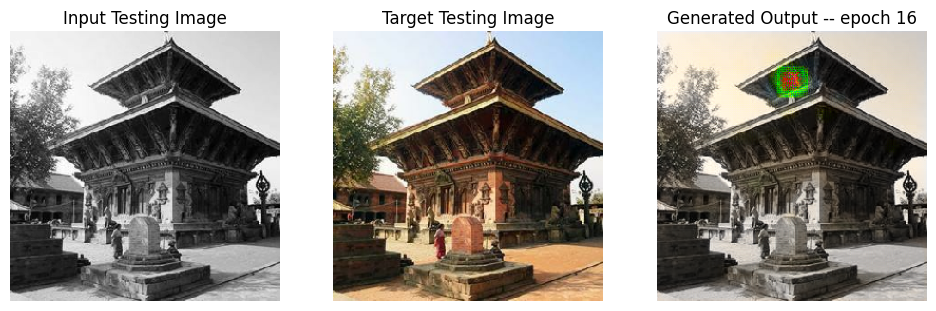

SSIM Score: 0.9376047253608704
PSNR Score: 17.076862335205078
Epoch 16
Training Details
Generator-- total_loss:4.42 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:13.06 real_loss:13.06 generated_loss:0.00 --- SSIM 0.96 PSNR 25.28
Time taken for epoch 17 is 92.38195562362671 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.49 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:13.91 real_loss:13.91 generated_loss:0.00 --- SSIM 0.95 PSNR 23.90
Time taken for epoch 17 is 105.2029230594635 sec
Number of iteration 70: and Lambda = 140
Epoch 17
Training Details
Generator-- total_loss:4.34 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:12.89 real_loss:12.89 generated_loss:0.00 --- SSIM 0.96 PSNR 25.66
Time taken for epoch 18 is 92.39653873443604 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.00 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:12.33 real_loss:12.33 generated_loss:0.00 --- SSIM 0.96 PSNR 25.15
Time taken for

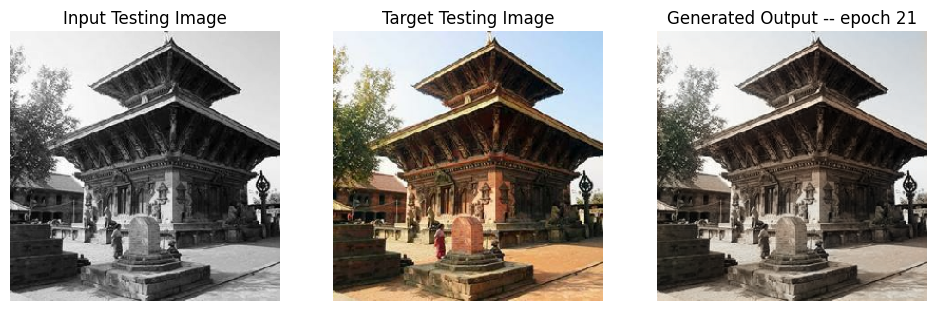

SSIM Score: 0.9746899008750916
PSNR Score: 24.853553771972656
Epoch 21
Training Details
Generator-- total_loss:4.55 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:13.03 real_loss:13.02 generated_loss:0.01 --- SSIM 0.95 PSNR 25.28
Time taken for epoch 22 is 92.50394749641418 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.50 gan_loss:0.00 l1_loss:0.05 Discriminator-- total_loss:11.80 real_loss:11.80 generated_loss:0.00 --- SSIM 0.95 PSNR 23.23
Time taken for epoch 22 is 105.2432873249054 sec
Number of iteration 70: and Lambda = 140
Epoch 22
Training Details
Generator-- total_loss:4.29 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:13.08 real_loss:13.08 generated_loss:0.00 --- SSIM 0.96 PSNR 25.87
Time taken for epoch 23 is 93.36237597465515 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.09 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:12.35 real_loss:12.35 generated_loss:0.00 --- SSIM 0.96 PSNR 25.00
Time taken for

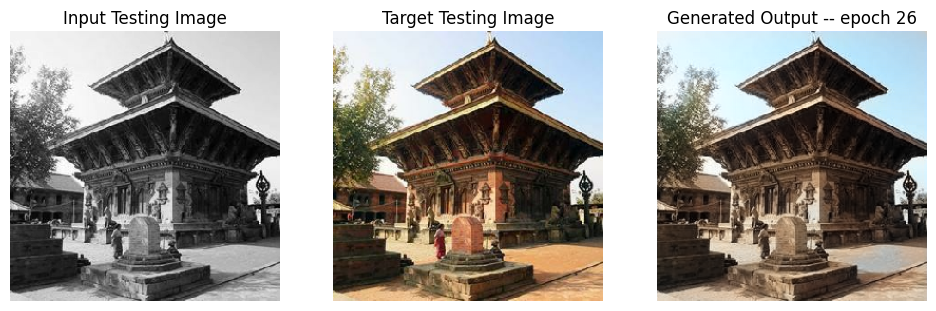

SSIM Score: 0.9767968654632568
PSNR Score: 26.884851455688477
Epoch 26
Training Details
Generator-- total_loss:4.23 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:12.88 real_loss:12.88 generated_loss:0.00 --- SSIM 0.96 PSNR 26.00
Time taken for epoch 27 is 92.41211557388306 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.15 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:12.87 real_loss:12.87 generated_loss:0.00 --- SSIM 0.96 PSNR 24.91
Time taken for epoch 27 is 105.22172284126282 sec
Number of iteration 70: and Lambda = 140
Epoch 27
Training Details
Generator-- total_loss:4.22 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:12.87 real_loss:12.87 generated_loss:0.00 --- SSIM 0.96 PSNR 26.04
Time taken for epoch 28 is 93.23223900794983 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.18 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:14.06 real_loss:14.06 generated_loss:0.00 --- SSIM 0.95 PSNR 24.83
Time taken fo

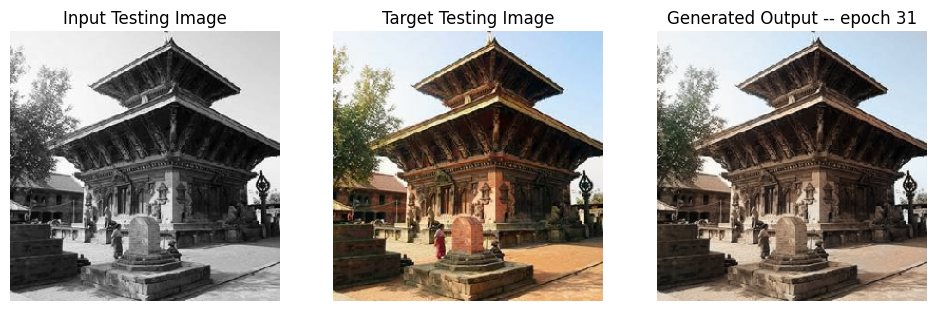

SSIM Score: 0.9786121845245361
PSNR Score: 27.53868865966797
Epoch 31
Training Details
Generator-- total_loss:12.65 gan_loss:8.47 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.11
Time taken for epoch 32 is 104.66877222061157 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.89 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:6.67 real_loss:6.66 generated_loss:0.01 --- SSIM 0.96 PSNR 25.25
Time taken for epoch 32 is 117.45855903625488 sec
Number of iteration 70: and Lambda = 140
Epoch 32
Training Details
Generator-- total_loss:13.49 gan_loss:9.31 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.12
Time taken for epoch 33 is 104.45113229751587 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.89 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:6.14 real_loss:6.13 generated_loss:0.01 --- SSIM 0.96 PSNR 25.26
Time taken for epo

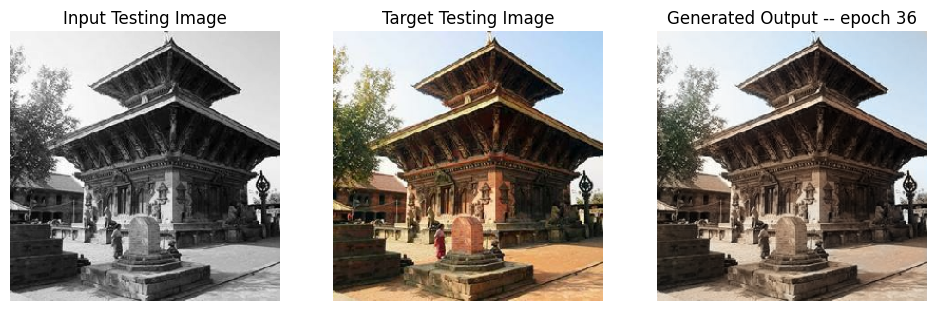

SSIM Score: 0.978689968585968
PSNR Score: 27.568037033081055
Reduced generator learning rate to 0.0002025000096182339 at epoch 36
Epoch 36
Training Details
Generator-- total_loss:4.27 gan_loss:0.04 l1_loss:0.03 Discriminator-- total_loss:10.31 real_loss:10.31 generated_loss:0.00 --- SSIM 0.96 PSNR 25.83
Time taken for epoch 37 is 92.60321187973022 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.96 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.46 real_loss:11.46 generated_loss:0.00 --- SSIM 0.96 PSNR 25.04
Time taken for epoch 37 is 105.53567624092102 sec
Number of iteration 70: and Lambda = 140
Epoch 37
Training Details
Generator-- total_loss:4.16 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:8.93 real_loss:8.93 generated_loss:0.00 --- SSIM 0.96 PSNR 26.00
Time taken for epoch 38 is 93.53301286697388 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.99 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.14 real_los

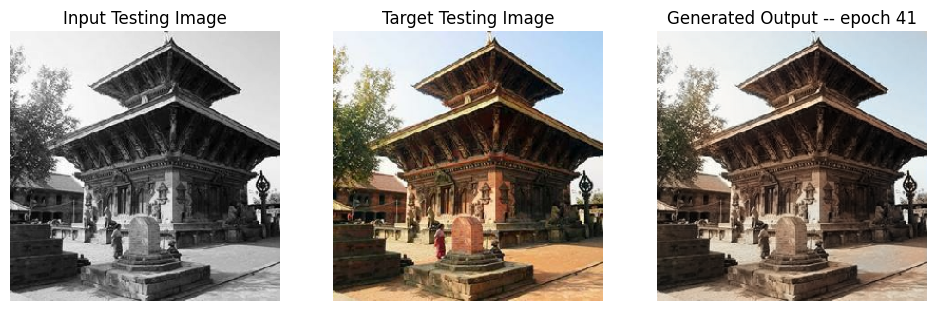

SSIM Score: 0.9791379570960999
PSNR Score: 27.504995346069336
Epoch 41
Training Details
Generator-- total_loss:4.15 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:8.86 real_loss:8.86 generated_loss:0.00 --- SSIM 0.96 PSNR 26.04
Time taken for epoch 42 is 93.32756495475769 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.07 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:10.82 real_loss:10.82 generated_loss:0.00 --- SSIM 0.96 PSNR 24.83
Time taken for epoch 42 is 106.3016607761383 sec
Number of iteration 70: and Lambda = 140
Epoch 42
Training Details
Generator-- total_loss:4.12 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:8.78 real_loss:8.78 generated_loss:0.00 --- SSIM 0.96 PSNR 26.10
Time taken for epoch 43 is 92.67046117782593 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.97 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.60 real_loss:11.60 generated_loss:0.00 --- SSIM 0.96 PSNR 25.08
Time taken for epo

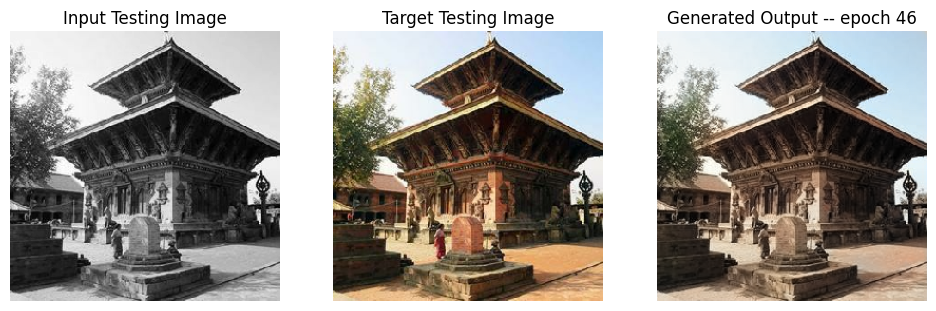

SSIM Score: 0.9792925715446472
PSNR Score: 28.543006896972656
Epoch 46
Training Details
Generator-- total_loss:12.26 gan_loss:8.17 l1_loss:0.03 Discriminator-- total_loss:0.01 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.14
Time taken for epoch 47 is 103.63115000724792 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.90 gan_loss:0.05 l1_loss:0.03 Discriminator-- total_loss:3.79 real_loss:3.74 generated_loss:0.05 --- SSIM 0.96 PSNR 25.19
Time taken for epoch 47 is 116.5472149848938 sec
Number of iteration 70: and Lambda = 140
Epoch 47
Training Details
Generator-- total_loss:13.36 gan_loss:9.27 l1_loss:0.03 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.15
Time taken for epoch 48 is 103.74942374229431 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.90 gan_loss:0.04 l1_loss:0.03 Discriminator-- total_loss:4.10 real_loss:4.07 generated_loss:0.04 --- SSIM 0.96 PSNR 25.18
Time taken for epo

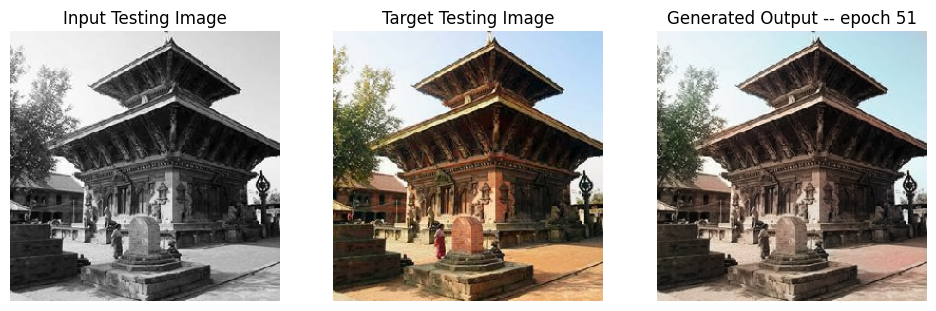

SSIM Score: 0.974359929561615
PSNR Score: 26.98753547668457
Epoch 51
Training Details
Generator-- total_loss:4.11 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:10.79 real_loss:10.79 generated_loss:0.00 --- SSIM 0.96 PSNR 26.18
Time taken for epoch 52 is 93.22899889945984 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.00 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.52 real_loss:11.52 generated_loss:0.00 --- SSIM 0.95 PSNR 25.09
Time taken for epoch 52 is 106.03859949111938 sec
Number of iteration 70: and Lambda = 140
Epoch 52
Training Details
Generator-- total_loss:4.12 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:10.25 real_loss:10.25 generated_loss:0.00 --- SSIM 0.96 PSNR 26.15
Time taken for epoch 53 is 92.13011193275452 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.88 gan_loss:0.00 l1_loss:0.03 Discriminator-- total_loss:10.97 real_loss:10.97 generated_loss:0.00 --- SSIM 0.95 PSNR 25.19
Time taken for 

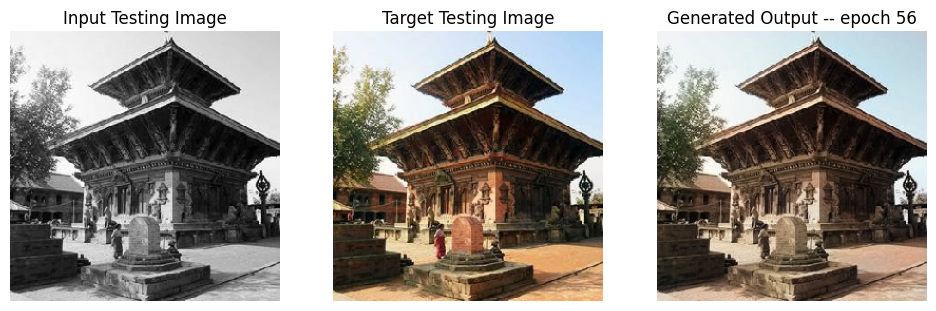

SSIM Score: 0.9804629683494568
PSNR Score: 28.699552536010742
Epoch 56
Training Details
Generator-- total_loss:4.09 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:7.85 real_loss:7.85 generated_loss:0.00 --- SSIM 0.96 PSNR 26.12
Time taken for epoch 57 is 91.76135873794556 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.27 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:10.80 real_loss:10.80 generated_loss:0.00 --- SSIM 0.95 PSNR 24.52
Time taken for epoch 57 is 104.29106211662292 sec
Number of iteration 70: and Lambda = 140
Reduced discriminator learning rate to 2.700000040931627e-05 at epoch 57.
Epoch 57
Training Details
Generator-- total_loss:8.37 gan_loss:4.30 l1_loss:0.03 Discriminator-- total_loss:0.30 real_loss:0.15 generated_loss:0.14 --- SSIM 0.96 PSNR 26.19
Time taken for epoch 58 is 103.20206999778748 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.10 gan_loss:0.22 l1_loss:0.03 Discriminator-- total_loss:2.42 real

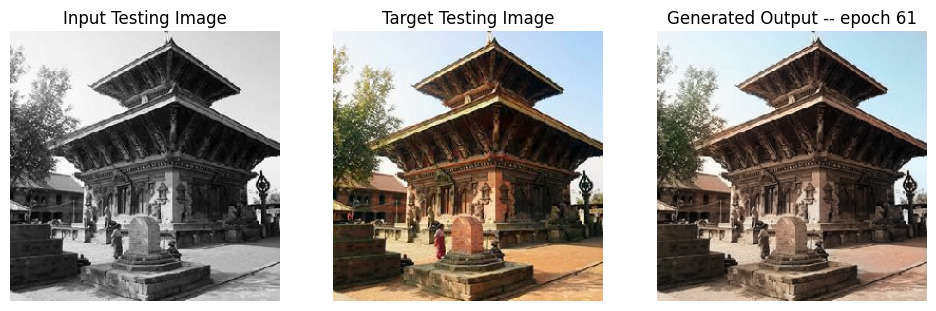

SSIM Score: 0.9768590331077576
PSNR Score: 28.140132904052734
Epoch 61
Training Details
Generator-- total_loss:11.70 gan_loss:7.63 l1_loss:0.03 Discriminator-- total_loss:0.01 real_loss:0.01 generated_loss:0.01 --- SSIM 0.96 PSNR 26.18
Time taken for epoch 62 is 103.40155363082886 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.04 gan_loss:0.18 l1_loss:0.03 Discriminator-- total_loss:2.69 real_loss:2.53 generated_loss:0.16 --- SSIM 0.96 PSNR 25.20
Time taken for epoch 62 is 115.96211552619934 sec
Number of iteration 70: and Lambda = 140
Epoch 62
Training Details
Generator-- total_loss:12.00 gan_loss:7.92 l1_loss:0.03 Discriminator-- total_loss:0.01 real_loss:0.01 generated_loss:0.01 --- SSIM 0.96 PSNR 26.18
Time taken for epoch 63 is 102.70860362052917 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.02 gan_loss:0.17 l1_loss:0.03 Discriminator-- total_loss:2.60 real_loss:2.46 generated_loss:0.14 --- SSIM 0.96 PSNR 25.19
Time taken for ep

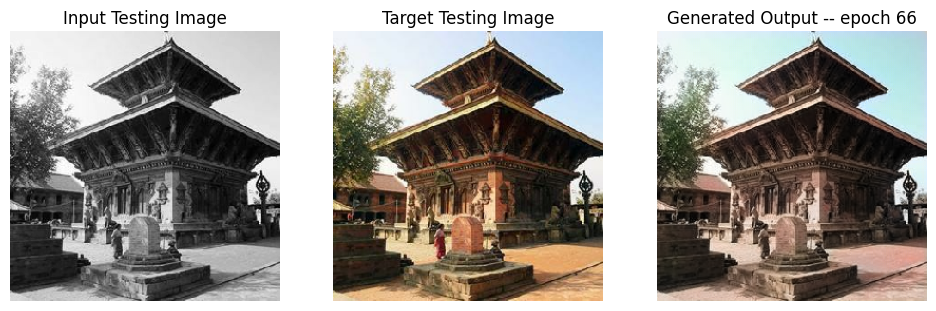

SSIM Score: 0.9703645706176758
PSNR Score: 27.381633758544922
Epoch 66
Training Details
Generator-- total_loss:4.10 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:8.60 real_loss:8.60 generated_loss:0.00 --- SSIM 0.96 PSNR 26.14
Time taken for epoch 67 is 91.1925950050354 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.04 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.09 real_loss:11.08 generated_loss:0.00 --- SSIM 0.95 PSNR 24.92
Time taken for epoch 67 is 103.75521111488342 sec
Number of iteration 70: and Lambda = 140
Epoch 67
Training Details
Generator-- total_loss:4.10 gan_loss:0.01 l1_loss:0.03 Discriminator-- total_loss:8.71 real_loss:8.70 generated_loss:0.01 --- SSIM 0.96 PSNR 26.17
Time taken for epoch 68 is 92.86448383331299 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.91 gan_loss:0.00 l1_loss:0.04 Discriminator-- total_loss:11.33 real_loss:11.33 generated_loss:0.00 --- SSIM 0.95 PSNR 25.17
Time taken for epo

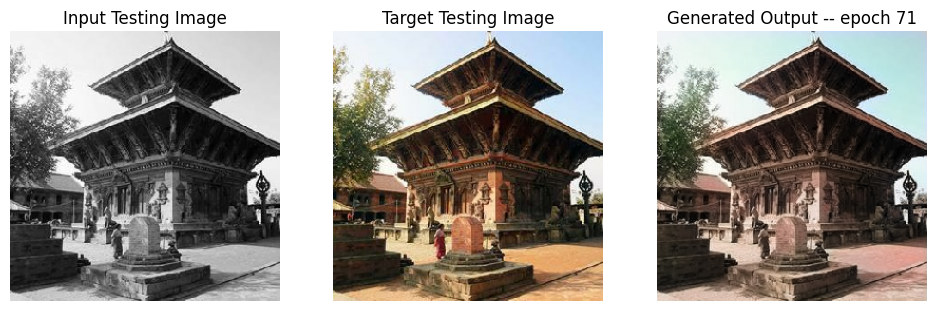

SSIM Score: 0.9726851582527161
PSNR Score: 27.339096069335938
Reduced discriminator learning rate to 8.100000013655517e-06 at epoch 71.
Epoch 71
Training Details
Generator-- total_loss:6.52 gan_loss:2.43 l1_loss:0.03 Discriminator-- total_loss:1.09 real_loss:0.59 generated_loss:0.50 --- SSIM 0.96 PSNR 26.17
Time taken for epoch 72 is 102.43968605995178 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.35 gan_loss:0.45 l1_loss:0.04 Discriminator-- total_loss:1.80 real_loss:1.42 generated_loss:0.39 --- SSIM 0.95 PSNR 25.17
Time taken for epoch 72 is 114.95889353752136 sec
Number of iteration 70: and Lambda = 140
Epoch 72
Training Details
Generator-- total_loss:7.45 gan_loss:3.36 l1_loss:0.03 Discriminator-- total_loss:0.48 real_loss:0.19 generated_loss:0.29 --- SSIM 0.96 PSNR 26.17
Time taken for epoch 73 is 102.82306909561157 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.14 gan_loss:0.24 l1_loss:0.04 Discriminator-- total_loss:2.33 real_

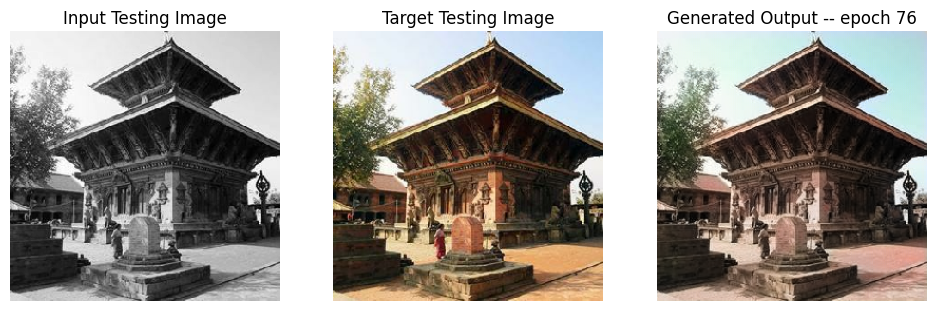

SSIM Score: 0.9717204570770264
PSNR Score: 27.48172950744629
Epoch 76
Training Details
Generator-- total_loss:8.70 gan_loss:4.62 l1_loss:0.03 Discriminator-- total_loss:0.16 real_loss:0.07 generated_loss:0.09 --- SSIM 0.96 PSNR 26.17
Time taken for epoch 77 is 102.637770652771 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.25 gan_loss:0.35 l1_loss:0.04 Discriminator-- total_loss:1.92 real_loss:1.65 generated_loss:0.27 --- SSIM 0.95 PSNR 25.17
Time taken for epoch 77 is 115.1456708908081 sec
Number of iteration 70: and Lambda = 140
Reduced generator learning rate to 1.845281385612907e-05 at epoch 77
Epoch 77
Training Details
Generator-- total_loss:4.33 gan_loss:0.08 l1_loss:0.03 Discriminator-- total_loss:5.85 real_loss:5.78 generated_loss:0.08 --- SSIM 0.95 PSNR 25.75
Time taken for epoch 78 is 91.14836764335632 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.13 gan_loss:0.01 l1_loss:0.04 Discriminator-- total_loss:6.45 real_loss:6.44 

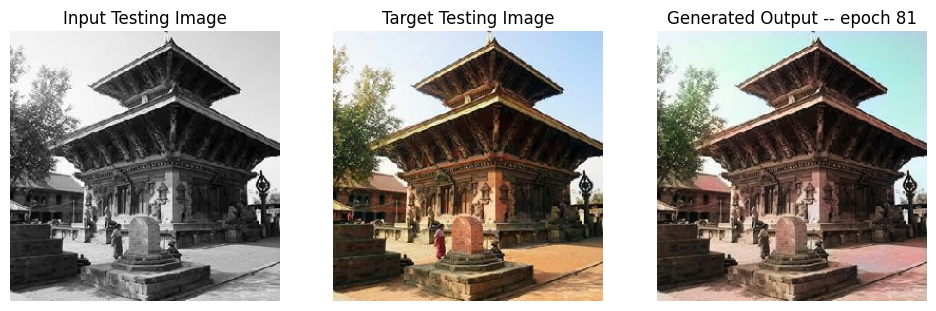

SSIM Score: 0.9630007743835449
PSNR Score: 26.856504440307617
Epoch 81
Training Details
Generator-- total_loss:4.21 gan_loss:0.02 l1_loss:0.03 Discriminator-- total_loss:6.78 real_loss:6.69 generated_loss:0.09 --- SSIM 0.95 PSNR 25.93
Time taken for epoch 82 is 91.16060829162598 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.17 gan_loss:0.01 l1_loss:0.04 Discriminator-- total_loss:6.69 real_loss:6.68 generated_loss:0.01 --- SSIM 0.94 PSNR 24.75
Time taken for epoch 82 is 103.6865062713623 sec
Number of iteration 70: and Lambda = 140
Epoch 82
Training Details
Generator-- total_loss:4.20 gan_loss:0.02 l1_loss:0.03 Discriminator-- total_loss:6.82 real_loss:6.75 generated_loss:0.07 --- SSIM 0.95 PSNR 25.96
Time taken for epoch 83 is 92.47914004325867 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.17 gan_loss:0.01 l1_loss:0.04 Discriminator-- total_loss:7.10 real_loss:7.09 generated_loss:0.01 --- SSIM 0.94 PSNR 24.77
Time taken for epoch 8

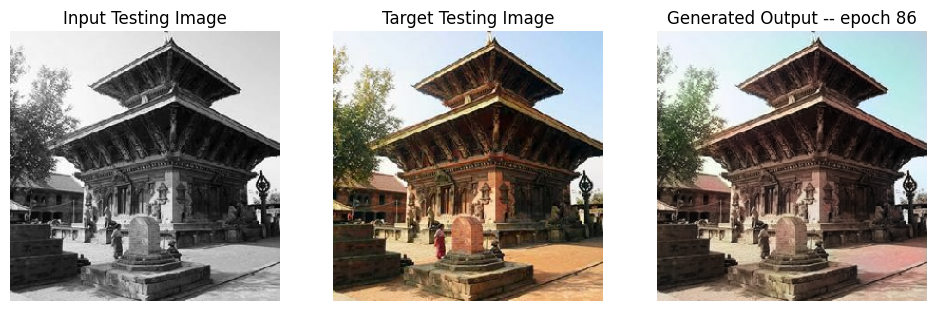

SSIM Score: 0.9703513979911804
PSNR Score: 27.609769821166992
Epoch 86
Training Details
Generator-- total_loss:6.31 gan_loss:2.16 l1_loss:0.03 Discriminator-- total_loss:0.95 real_loss:0.39 generated_loss:0.56 --- SSIM 0.95 PSNR 26.04
Time taken for epoch 87 is 103.20722842216492 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.99 gan_loss:0.92 l1_loss:0.04 Discriminator-- total_loss:1.43 real_loss:0.81 generated_loss:0.62 --- SSIM 0.95 PSNR 24.92
Time taken for epoch 87 is 115.79157614707947 sec
Number of iteration 70: and Lambda = 140
Epoch 87
Training Details
Generator-- total_loss:6.48 gan_loss:2.33 l1_loss:0.03 Discriminator-- total_loss:0.71 real_loss:0.33 generated_loss:0.38 --- SSIM 0.95 PSNR 26.04
Time taken for epoch 88 is 102.62466812133789 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.96 gan_loss:0.89 l1_loss:0.04 Discriminator-- total_loss:1.41 real_loss:0.84 generated_loss:0.57 --- SSIM 0.95 PSNR 24.92
Time taken for epoc

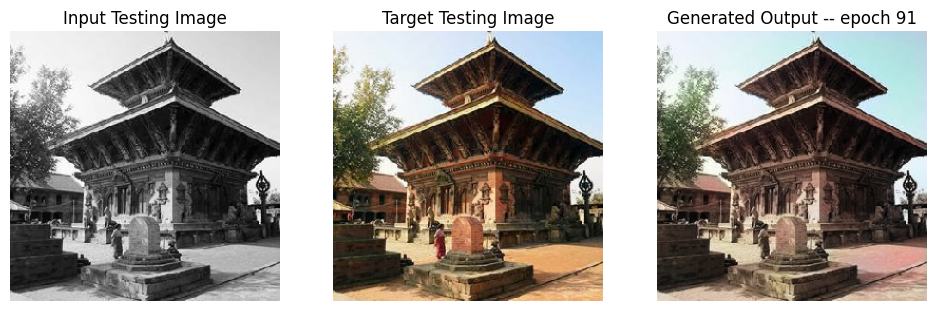

SSIM Score: 0.970271646976471
PSNR Score: 27.60517692565918
Epoch 91
Training Details
Generator-- total_loss:7.48 gan_loss:3.32 l1_loss:0.03 Discriminator-- total_loss:0.37 real_loss:0.16 generated_loss:0.20 --- SSIM 0.95 PSNR 26.01
Time taken for epoch 92 is 102.48231983184814 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:6.04 gan_loss:0.97 l1_loss:0.04 Discriminator-- total_loss:1.37 real_loss:0.82 generated_loss:0.55 --- SSIM 0.95 PSNR 24.92
Time taken for epoch 92 is 114.99136447906494 sec
Number of iteration 70: and Lambda = 140
Reduced generator learning rate to 8.303766480821651e-06 at epoch 92
Epoch 92
Training Details
Generator-- total_loss:4.39 gan_loss:0.12 l1_loss:0.03 Discriminator-- total_loss:4.83 real_loss:4.68 generated_loss:0.15 --- SSIM 0.95 PSNR 25.69
Time taken for epoch 93 is 91.10985112190247 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.07 gan_loss:0.03 l1_loss:0.04 Discriminator-- total_loss:4.85 real_loss:4.8

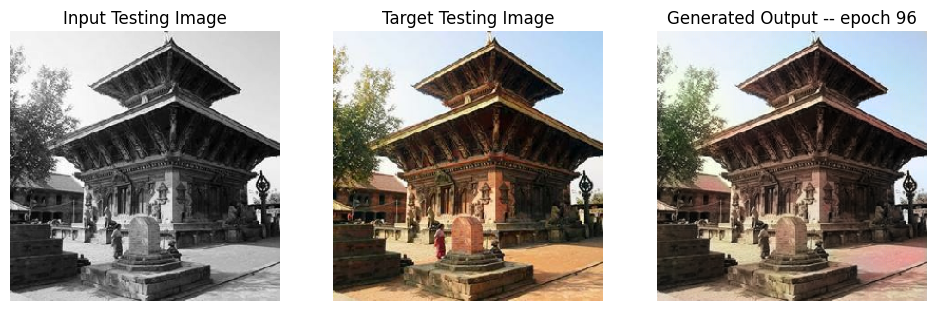

SSIM Score: 0.9737351536750793
PSNR Score: 28.56136131286621
Epoch 96
Training Details
Generator-- total_loss:4.17 gan_loss:0.04 l1_loss:0.03 Discriminator-- total_loss:6.60 real_loss:6.42 generated_loss:0.19 --- SSIM 0.96 PSNR 26.01
Time taken for epoch 97 is 91.31587982177734 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.93 gan_loss:0.02 l1_loss:0.04 Discriminator-- total_loss:5.77 real_loss:5.73 generated_loss:0.04 --- SSIM 0.95 PSNR 25.11
Time taken for epoch 97 is 103.85466003417969 sec
Number of iteration 70: and Lambda = 140
Epoch 97
Training Details
Generator-- total_loss:4.15 gan_loss:0.04 l1_loss:0.03 Discriminator-- total_loss:6.61 real_loss:6.44 generated_loss:0.17 --- SSIM 0.96 PSNR 26.05
Time taken for epoch 98 is 91.79878950119019 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:4.95 gan_loss:0.02 l1_loss:0.04 Discriminator-- total_loss:5.56 real_loss:5.51 generated_loss:0.04 --- SSIM 0.95 PSNR 25.07
Time taken for epoch 9

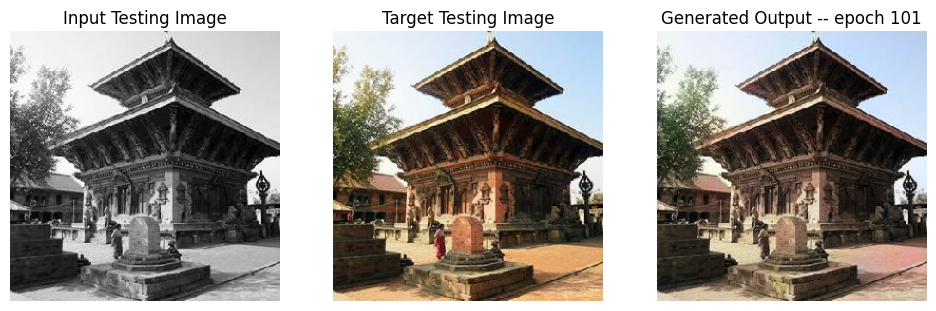

SSIM Score: 0.9756922125816345
PSNR Score: 28.546253204345703
Epoch 101
Training Details
Generator-- total_loss:4.64 gan_loss:0.54 l1_loss:0.03 Discriminator-- total_loss:3.10 real_loss:1.84 generated_loss:1.27 --- SSIM 0.96 PSNR 26.06
Time taken for epoch 102 is 102.61588764190674 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.60 gan_loss:0.70 l1_loss:0.04 Discriminator-- total_loss:1.64 real_loss:1.07 generated_loss:0.56 --- SSIM 0.95 PSNR 25.09
Time taken for epoch 102 is 115.2766785621643 sec
Number of iteration 70: and Lambda = 140
Epoch 102
Training Details
Generator-- total_loss:4.93 gan_loss:0.83 l1_loss:0.03 Discriminator-- total_loss:2.69 real_loss:1.30 generated_loss:1.39 --- SSIM 0.96 PSNR 26.06
Time taken for epoch 103 is 104.69966053962708 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.75 gan_loss:0.84 l1_loss:0.04 Discriminator-- total_loss:1.56 real_loss:0.89 generated_loss:0.67 --- SSIM 0.95 PSNR 25.10
Time taken for 

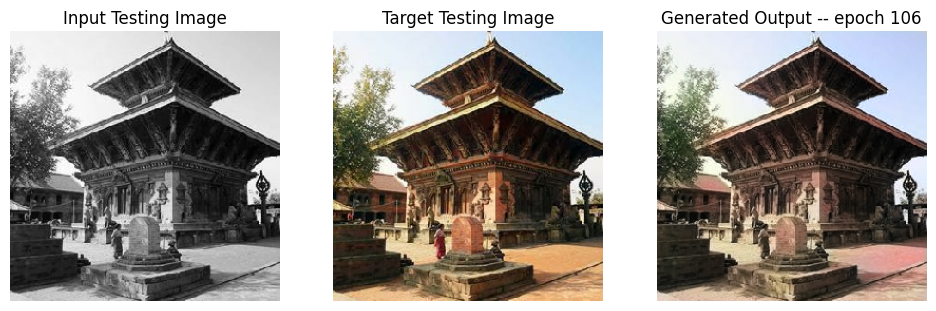

SSIM Score: 0.9737178683280945
PSNR Score: 28.4147891998291
Epoch 106
Training Details
Generator-- total_loss:4.33 gan_loss:0.08 l1_loss:0.03 Discriminator-- total_loss:5.05 real_loss:3.86 generated_loss:1.19 --- SSIM 0.96 PSNR 25.70
Time taken for epoch 107 is 91.55325222015381 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.29 gan_loss:0.22 l1_loss:0.04 Discriminator-- total_loss:2.26 real_loss:2.09 generated_loss:0.17 --- SSIM 0.95 PSNR 24.77
Time taken for epoch 107 is 103.98980951309204 sec
Number of iteration 70: and Lambda = 140
Epoch 107
Training Details
Generator-- total_loss:4.32 gan_loss:0.06 l1_loss:0.03 Discriminator-- total_loss:5.28 real_loss:4.04 generated_loss:1.24 --- SSIM 0.96 PSNR 25.69
Time taken for epoch 108 is 91.72831630706787 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.24 gan_loss:0.18 l1_loss:0.04 Discriminator-- total_loss:2.41 real_loss:2.27 generated_loss:0.14 --- SSIM 0.95 PSNR 24.81
Time taken for epo

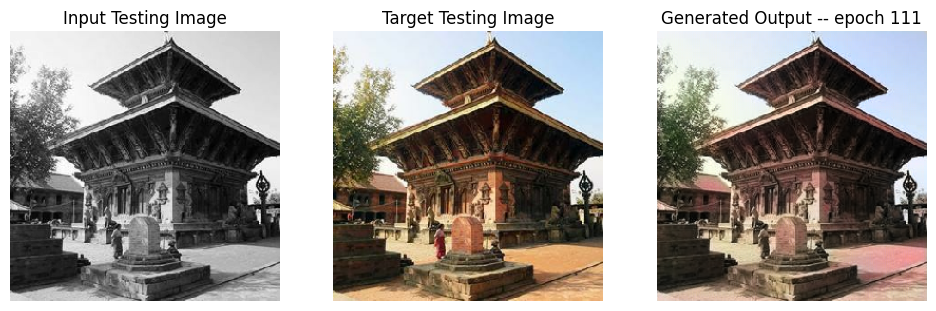

SSIM Score: 0.971705973148346
PSNR Score: 28.272010803222656
Epoch 111
Training Details
Generator-- total_loss:4.30 gan_loss:0.06 l1_loss:0.03 Discriminator-- total_loss:5.39 real_loss:4.19 generated_loss:1.20 --- SSIM 0.95 PSNR 25.71
Time taken for epoch 112 is 91.32178139686584 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.23 gan_loss:0.19 l1_loss:0.04 Discriminator-- total_loss:2.35 real_loss:2.21 generated_loss:0.14 --- SSIM 0.95 PSNR 24.84
Time taken for epoch 112 is 103.76650977134705 sec
Number of iteration 70: and Lambda = 140
Reduced discriminator learning rate to 2.1870000637136398e-07 at epoch 112.
Epoch 112
Training Details
Generator-- total_loss:4.31 gan_loss:0.07 l1_loss:0.03 Discriminator-- total_loss:5.17 real_loss:3.80 generated_loss:1.37 --- SSIM 0.96 PSNR 25.73
Time taken for epoch 113 is 102.93491506576538 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.37 gan_loss:0.33 l1_loss:0.04 Discriminator-- total_loss:1.93 

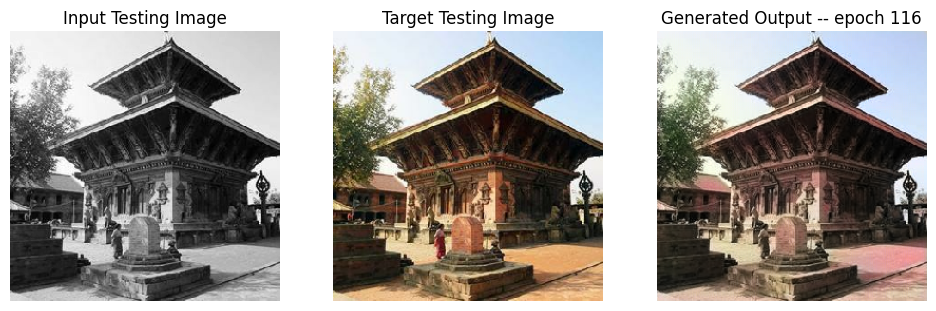

SSIM Score: 0.9712286591529846
PSNR Score: 28.062223434448242
Epoch 116
Training Details
Generator-- total_loss:4.50 gan_loss:0.27 l1_loss:0.03 Discriminator-- total_loss:4.32 real_loss:2.28 generated_loss:2.04 --- SSIM 0.96 PSNR 25.74
Time taken for epoch 117 is 102.82387256622314 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.98 gan_loss:0.94 l1_loss:0.04 Discriminator-- total_loss:1.39 real_loss:0.81 generated_loss:0.58 --- SSIM 0.95 PSNR 24.83
Time taken for epoch 117 is 115.31842517852783 sec
Number of iteration 70: and Lambda = 140
Epoch 117
Training Details
Generator-- total_loss:4.56 gan_loss:0.32 l1_loss:0.03 Discriminator-- total_loss:4.16 real_loss:2.10 generated_loss:2.06 --- SSIM 0.96 PSNR 25.74
Time taken for epoch 118 is 102.73029327392578 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.88 gan_loss:0.84 l1_loss:0.04 Discriminator-- total_loss:1.40 real_loss:0.89 generated_loss:0.51 --- SSIM 0.95 PSNR 24.84
Time taken for

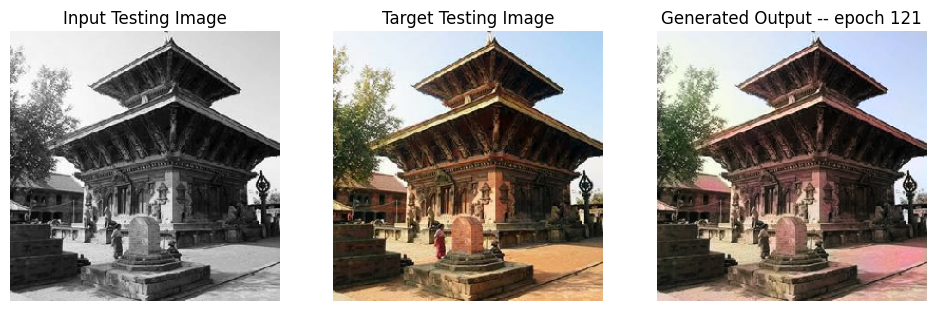

SSIM Score: 0.9697653651237488
PSNR Score: 27.80766487121582
Epoch 121
Training Details
Generator-- total_loss:4.43 gan_loss:0.08 l1_loss:0.03 Discriminator-- total_loss:5.71 real_loss:3.56 generated_loss:2.15 --- SSIM 0.95 PSNR 25.46
Time taken for epoch 122 is 90.98197174072266 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.69 gan_loss:0.55 l1_loss:0.04 Discriminator-- total_loss:1.59 real_loss:1.28 generated_loss:0.31 --- SSIM 0.95 PSNR 24.62
Time taken for epoch 122 is 103.3715648651123 sec
Number of iteration 70: and Lambda = 140
Epoch 122
Training Details
Generator-- total_loss:4.42 gan_loss:0.08 l1_loss:0.03 Discriminator-- total_loss:5.77 real_loss:3.67 generated_loss:2.10 --- SSIM 0.95 PSNR 25.47
Time taken for epoch 123 is 91.00043940544128 sec
Number of iteration {d} 245
Testing Details
Generator-- total_loss:5.58 gan_loss:0.43 l1_loss:0.04 Discriminator-- total_loss:1.74 real_loss:1.49 generated_loss:0.25 --- SSIM 0.95 PSNR 24.62
Time taken for epo

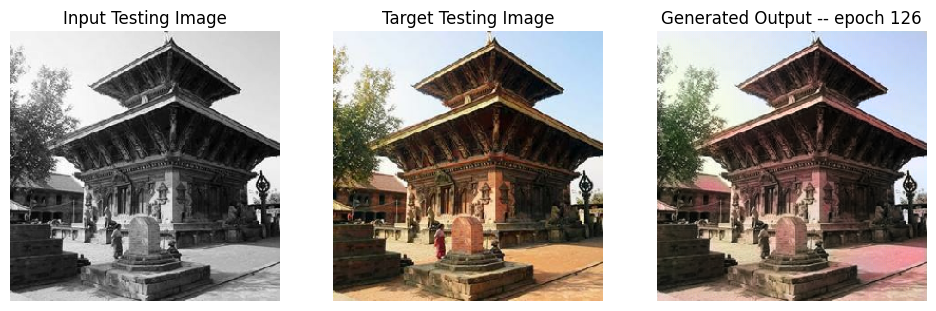

SSIM Score: 0.9682783484458923
PSNR Score: 27.659088134765625
Discriminator learning rate already at the minimum. Stopping training.


In [41]:
fit(train_dataset, epochs, test_dataset, gen)

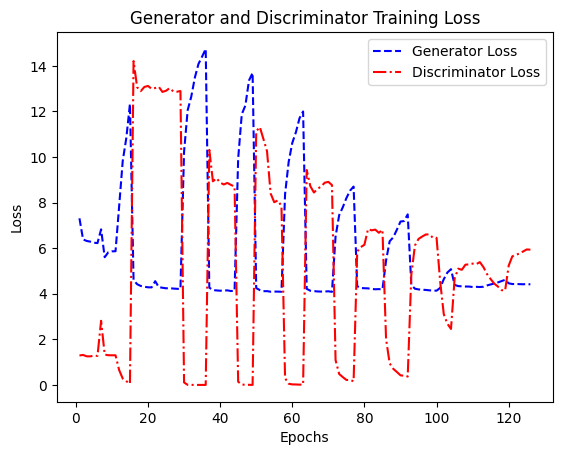

In [42]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

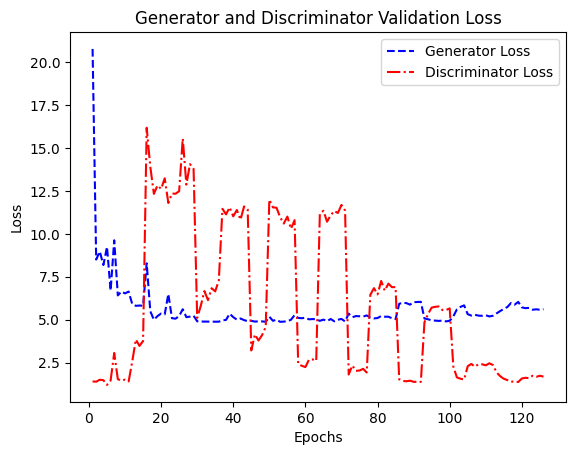

In [43]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

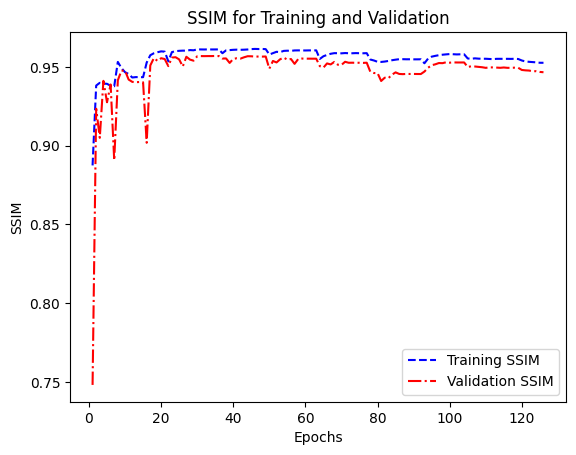

In [44]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.r', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

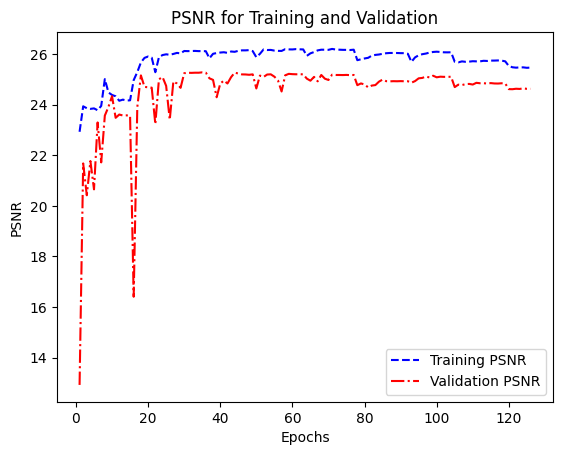

In [45]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.r', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

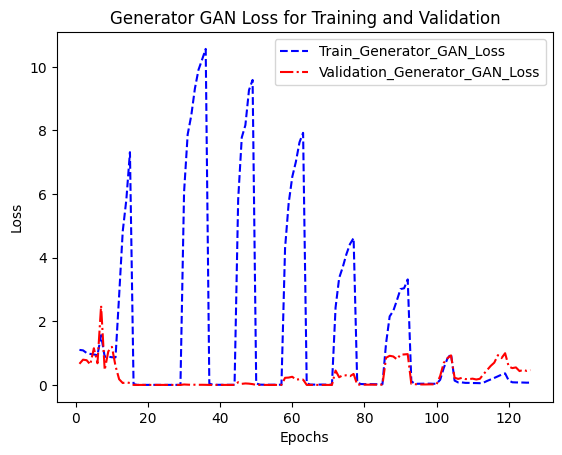

In [46]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

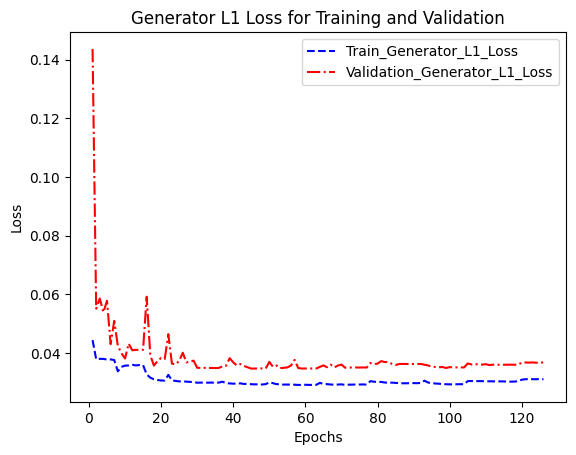

In [47]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

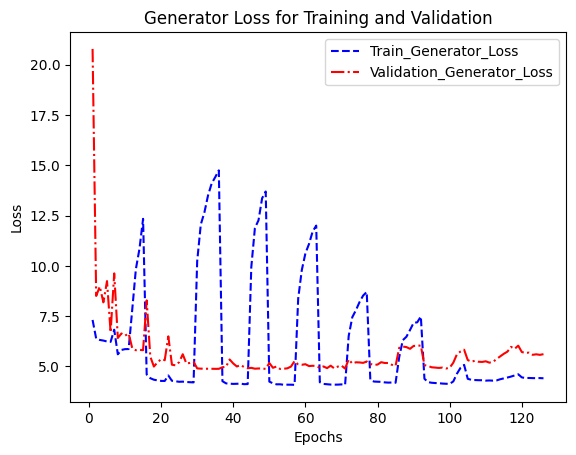

In [48]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

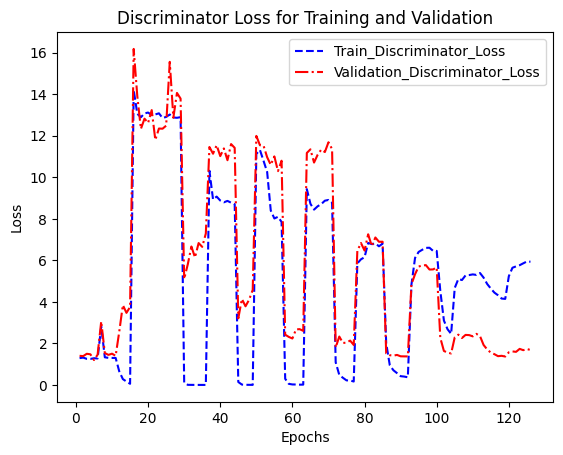

In [49]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

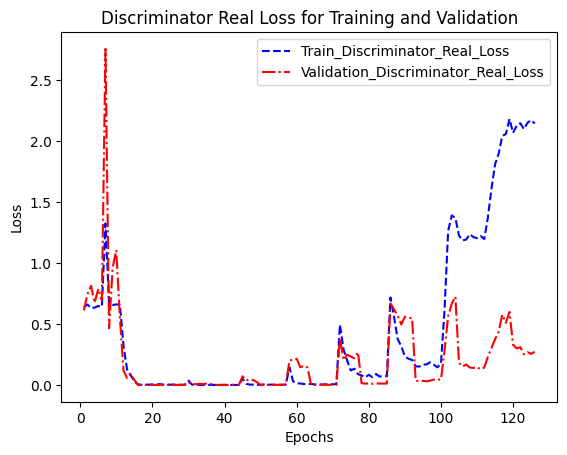

In [50]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

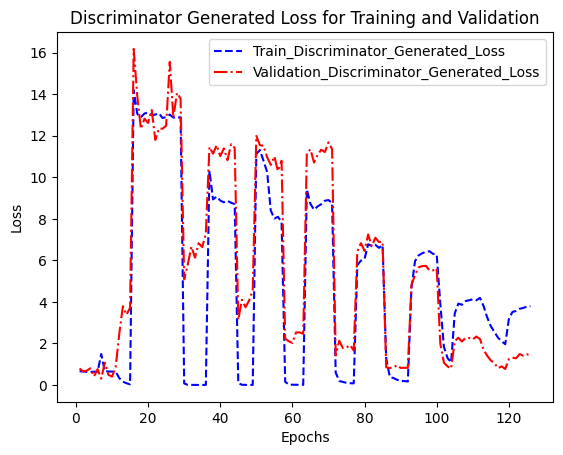

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [52]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [53]:
os.mkdir('/kaggle/working/modelsJan20')

In [54]:
gen.save('/kaggle/working/modelsJan20/gen.h5')
gen.save_weights('/kaggle/working/modelsJan20/gen.keras')
disc.save('/kaggle/working/modelsJan20/disc.h5')
disc.save_weights('/kaggle/working/modelsJan20/disc.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [55]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [56]:
import subprocess
from IPython.display import FileLink, display

In [57]:
download_file('/kaggle/working', 'outputJan20')

/kaggle/working/outputJan20.zip